### **Business Objectives:**
1. **Marketing Aspect**: Identify potential customers who are less likely to default and target them with personalized credit offers to maximize profitability.
2. **Application Aspect**: Improve the application process by quickly assessing creditworthiness, minimizing the time spent on high-risk applicants, and focusing on qualified borrowers.
3. **Performance Aspect**: Monitor the performance of extended credit, ensuring that loans generate consistent returns while keeping default rates low.
4. **Bad Debt Management**: Implement risk mitigation strategies to reduce losses from bad debt by identifying high-risk borrowers early and developing tailored repayment plans or stricter lending criteria.



### Step 1: **Data Understanding**
First, get familiar with your dataset. Here’s what each feature represents based on the sample you provided:
- `age`: Age of the applicant.
- `ed`: Level of education.
- `employ`: Years of employment.
- `address`: Years at the current address.
- `income`: Applicant's annual income (in thousands).
- `debtinc`: Debt-to-income ratio.
- `creddebt`: Credit card debt.
- `othdebt`: Other debt.
- `default`: Binary variable (1 if the applicant defaulted, 0 otherwise).

### Step 2: **Data Cleaning**
- **Handle missing values**: Check for any missing values and handle them (imputation or removal).
- **Correct data types**: Ensure that categorical variables are represented correctly and numerical variables are in their appropriate format.
- **Outlier detection**: Identify potential outliers, especially for financial variables like `income`, `debtinc`, `creddebt`, etc.

### Step 3: **Exploratory Data Analysis (EDA)**
- **Summary statistics**: Generate descriptive statistics (mean, median, standard deviation) for all numerical variables.
  ```python
  df.describe()
  ```
- **Visualizations**:
  - **Distribution of Variables**: Use histograms to visualize the distribution of `income`, `debtinc`, `creddebt`, and other variables.
    ```python
    df['income'].hist(bins=20)
    df['debtinc'].hist(bins=20)
    ```
  - **Correlation Matrix**: Plot a correlation matrix to see how variables like `income`, `creddebt`, and `othdebt` are related.
    ```python
    import seaborn as sns
    sns.heatmap(df.corr(), annot=True)
    ```
  - **Box plots for outliers**: Box plots can help you visually detect outliers.
    ```python
    df.boxplot(column=['income', 'debtinc', 'creddebt'])
    ```
- **Trend analysis**: Look for any clear relationships, such as how `debtinc` changes with `income` or whether `employ` affects default rate.
  ```python
  sns.scatterplot(x='income', y='debtinc', hue='default', data=df)
  ```

### Step 4: **Feature Engineering**
- **Create new features**: Consider adding new features that may provide more predictive power, such as:
  - **Total Debt**: `Total_debt = creddebt + othdebt`
  - **Debt-to-income ratio category**: Group `debtinc` into categories (e.g., Low, Medium, High).
  - **Age buckets**: Group `age` into ranges like 18-25, 26-35, etc.
  
### Step 5: **Predictive Modeling**
Now, apply machine learning models to predict the likelihood of default.

- **Data Split**: Split the data into train and test sets.
  ```python
  from sklearn.model_selection import train_test_split
  X = df.drop(columns=['default'])
  y = df['default']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  ```
  
- **Modeling**: Choose models such as Logistic Regression, Decision Trees, Random Forests, or XGBoost.
  ```python
  from sklearn.ensemble import RandomForestClassifier
  model = RandomForestClassifier()
  model.fit(X_train, y_train)
  y_pred = model.predict(X_test)
  ```

- **Evaluation**: Evaluate the model's performance using accuracy, precision, recall, F1 score, and ROC-AUC.
  ```python
  from sklearn.metrics import classification_report, roc_auc_score
  print(classification_report(y_test, y_pred))
  roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:,1])
  ```

### Step 6: **Insights and Conclusions**
- **Outliers**: If your analysis finds that certain individuals have extremely high debt-to-income ratios, these might be outliers or high-risk applicants.
- **Trends**: Analyze trends in `income`, `debtinc`, and `employ` that can indicate patterns in credit risk.
  - Applicants with longer employment history and lower debt-to-income ratios may have lower default rates.
- **Key factors**: Your correlation matrix and model feature importance will highlight which variables (like `creddebt` or `income`) have the biggest influence on defaults.
  
### Step 7: **Business Recommendations**
- **Marketing**: Target applicants with lower `debtinc` and longer employment history for favorable offers.
- **Application**: Implement thresholds for certain features (e.g., rejecting applicants with a `debtinc` > 40%).
- **Bad Debt Management**: Closely monitor applicants with high `creddebt` or those who are younger with fewer years of employment.


In [27]:
# !pip install kagglehub
# !pip install kaggle

In [28]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("atulmittal199174/credit-risk-analysis-for-extending-bank-loans")

print("Path to dataset files:", path)

Path to dataset files: /Users/apple/.cache/kagglehub/datasets/atulmittal199174/credit-risk-analysis-for-extending-bank-loans/versions/1


In [29]:
import pandas as pd

df=pd.read_csv("/Users/apple/.cache/kagglehub/datasets/atulmittal199174/credit-risk-analysis-for-extending-bank-loans/versions/1/bankloans.csv")

In [30]:
df.shape

(1150, 9)

In [31]:
df.isnull().sum()

age           0
ed            0
employ        0
address       0
income        0
debtinc       0
creddebt      0
othdebt       0
default     450
dtype: int64

In [32]:
df.value_counts()

age  ed  employ  address  income  debtinc  creddebt  othdebt    default
20   1   4       0        14      9.7      0.200984  1.157016   1.0        1
39   1   10      4        31      4.8      0.184512  1.303488   0.0        1
         0       8        39      7.9      1.066026  2.014974   0.0        1
         2       15       22      23.1     1.915914  3.166086   1.0        1
         4       9        38      6.5      1.178190  1.291810   0.0        1
                                                                          ..
30   2   8       4        56      6.4      0.333312  3.250688   0.0        1
         10      4        22      16.1     1.409716  2.132284   0.0        1
         12      9        68      20.1     2.856612  10.811388  0.0        1
                          98      7.2      2.935296  4.120704   0.0        1
56   1   11      20       59      15.0     4.672800  4.177200   0.0        1
Name: count, Length: 700, dtype: int64

In [33]:
import ydata_profiling as pp
pp.ProfileReport(df)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Performing the EDA

In [82]:
df

,age,ed,employ,address,income,debtinc,creddebt,othdebt,default
0,41,3,17,12,176,9.3,11.359392,5.008608,1.0
1,27,1,10,6,31,17.3,1.362202,4.000798,0.0
2,40,1,15,14,55,5.5,0.856075,2.168925,0.0
3,41,1,15,14,120,2.9,2.658720,0.821280,0.0
4,24,2,2,0,28,17.3,1.787436,3.056564,1.0
...,...,...,...,...,...,...,...,...,...
695,36,2,6,15,27,4.6,0.262062,0.979938,1.0
696,29,2,6,4,21,11.5,0.369495,2.045505,0.0
697,33,1,15,3,32,7.6,0.491264,1.940736,0.0
698,45,1,19,22,77,8.4,2.302608,4.165392,0.0


In [81]:
df.describe()

,age,ed,employ,address,income,debtinc,creddebt,othdebt,default
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000
mean,34.860000,1.722857,8.388571,8.278571,45.601429,10.260571,1.553553,3.058209,0.261429
std,7.997342,0.928206,6.658039,6.824877,36.814226,6.827234,2.117197,3.287555,0.439727
min,20.000000,1.000000,0.000000,0.000000,14.000000,0.400000,0.011696,0.045584,0.000000
25%,29.000000,1.000000,3.000000,3.000000,24.000000,5.000000,0.369059,1.044178,0.000000
50%,34.000000,1.000000,7.000000,7.000000,34.000000,8.600000,0.854869,1.987567,0.000000
75%,40.000000,2.000000,12.000000,12.000000,55.000000,14.125000,1.901955,3.923065,1.000000
max,56.000000,5.000000,31.000000,34.000000,446.000000,41.300000,20.561310,27.033600,1.000000


In [34]:
df.dropna(inplace=True)

In [35]:
df.shape

(700, 9)

In [36]:
df.columns

Index(['age', 'ed', 'employ', 'address', 'income', 'debtinc', 'creddebt',
       'othdebt', 'default'],
      dtype='object')

In [37]:
df.corr()

,age,ed,employ,address,income,debtinc,creddebt,othdebt,default
age,1.000000,0.022325,0.536497,0.597591,0.478710,0.016398,0.295207,0.340217,-0.137657
ed,0.022325,1.000000,-0.153621,0.056919,0.235190,0.008838,0.088274,0.165459,0.114676
employ,0.536497,-0.153621,1.000000,0.322334,0.619681,-0.031182,0.403694,0.406091,-0.282978
address,0.597591,0.056919,0.322334,1.000000,0.316245,0.011323,0.208435,0.226514,-0.164451
income,0.478710,0.235190,0.619681,0.316245,1.000000,-0.026777,0.570199,0.610659,-0.070970
debtinc,0.016398,0.008838,-0.031182,0.011323,-0.026777,1.000000,0.501767,0.584870,0.389575
creddebt,0.295207,0.088274,0.403694,0.208435,0.570199,0.501767,1.000000,0.633104,0.244740
othdebt,0.340217,0.165459,0.406091,0.226514,0.610659,0.584870,0.633104,1.000000,0.145713
default,-0.137657,0.114676,-0.282978,-0.164451,-0.070970,0.389575,0.244740,0.145713,1.000000


In [38]:
import ydata_profiling as pp

In [39]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: xlabel='age', ylabel='income'>

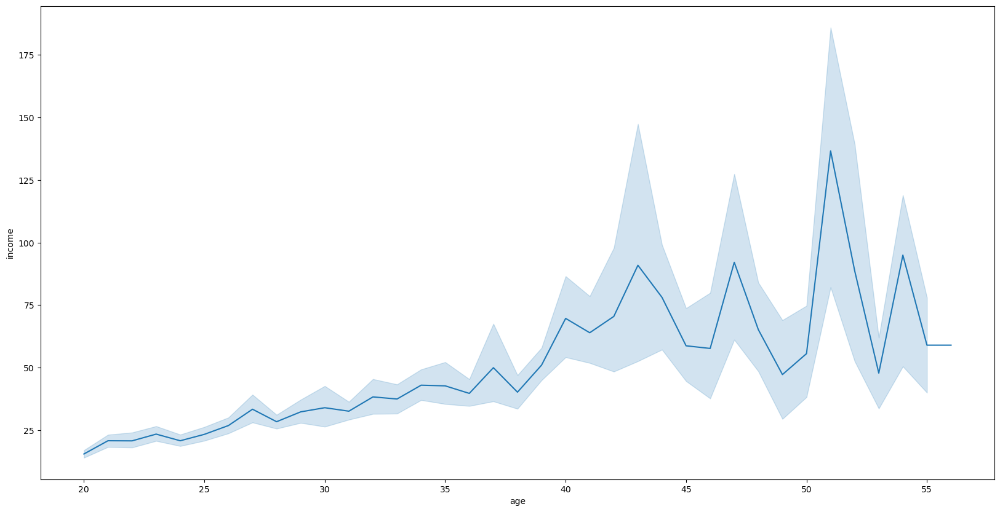

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

fig,ax = plt.subplots(figsize=(20,10))
sns.lineplot(x= 'age', y= 'income', data=df, ax=ax)


<Axes: xlabel='age', ylabel='debtinc'>

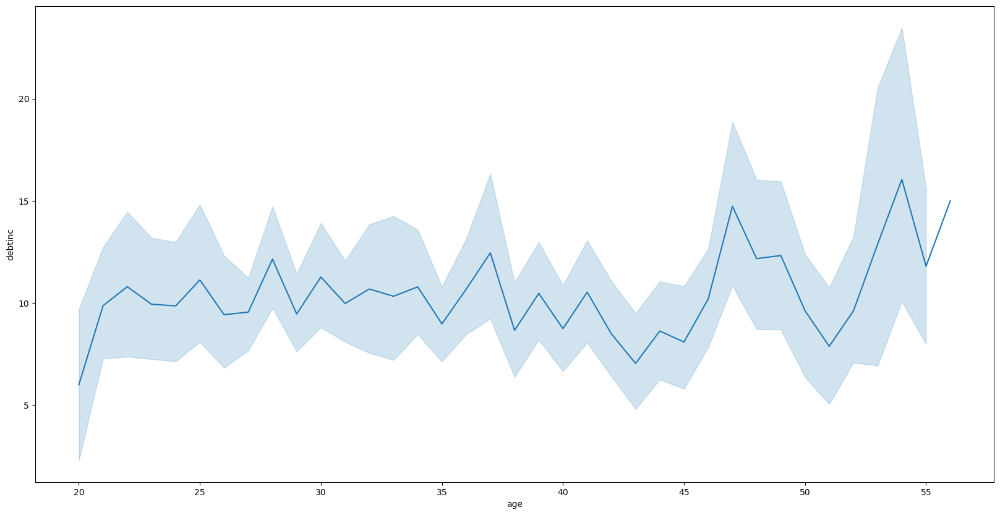

In [41]:
fig,ax = plt.subplots(figsize=(20,10))
sns.lineplot(x= 'age', y= 'debtinc', data=df, ax=ax)

In [42]:
df['default'].value_counts()

default
0.0    517
1.0    183
Name: count, dtype: int64

In [43]:
x=df.drop(['default'],axis=1)
y=df['default']

In [46]:
x.shape
y.shape

(700,)

In [62]:
from sklearn.model_selection import train_test_split , GridSearchCV , cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm  import SVC

In [63]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=42)

In [64]:
sc = StandardScaler()
xtrain=sc.fit_transform(xtrain)
xtest=sc.fit_transform(xtest)

In [65]:
rfc = RandomForestClassifier(n_estimators=200)

In [66]:
rfc.fit(xtrain,ytrain)

RandomForestClassifier(n_estimators=200)

In [67]:
rfc.score(xtest,ytest)

0.8

In [68]:
rfc2 = cross_val_score(estimator=rfc,X=xtrain,y=ytrain,cv=10)
rfc2.mean()

0.7803571428571427

In [69]:
sv =SVC()
sv.fit(xtrain,ytrain)

SVC()

In [70]:
sv.score(xtest,ytest)

0.7928571428571428

In [71]:
model = GridSearchCV(sv,{
    'C':[0.1,0.2,0.4,0.8,1.2,1.8,4.0,7.0],
    'gamma':[0.1,0.4,0.8,1.0,2.0,3.0],
    'kernel':['rbf','linear']
},scoring='accuracy',cv=10)

In [72]:
model.fit(xtrain,ytrain)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.1, 0.2, 0.4, 0.8, 1.2, 1.8, 4.0, 7.0],
                         'gamma': [0.1, 0.4, 0.8, 1.0, 2.0, 3.0],
                         'kernel': ['rbf', 'linear']},
             scoring='accuracy')

In [73]:
model.best_params_

{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}

In [74]:
model2 = SVC(C=0.1,gamma=0.1,kernel='linear')
model2.fit(xtrain,ytrain)
model2.score(xtest,ytest)

0.8214285714285714

In [78]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

In [79]:
lr = LogisticRegression()
lr.fit(xtrain,ytrain)
lr.score(xtest,ytest)

0.8357142857142857

<Axes: >

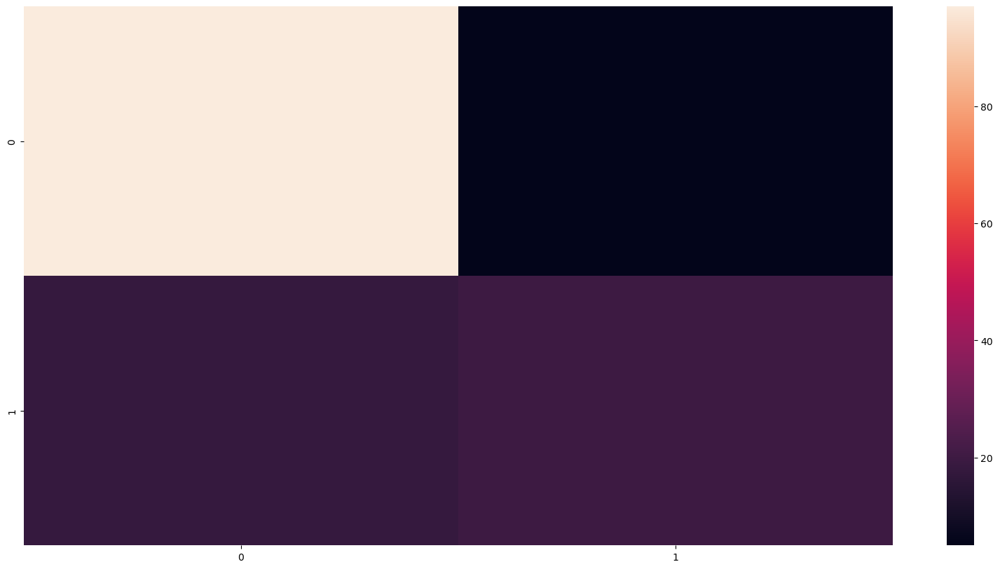

In [80]:
yp = lr.predict(xtest)
c = confusion_matrix(ytest,yp)
fig,ax = plt.subplots(figsize=(20,10))
sns.heatmap(c,ax=ax)